# VLMs as training samples filter

In [1]:
import os
import random
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Display settings
plt.style.use("seaborn-v0_8-whitegrid")
pd.set_option("display.max_columns", None)

In [2]:
metadata_path = "/tier1/_q4/intern/eefun/webscraping/filtering/storage (processed)/180925/3/accepted/metadata.jsonl"
image_dir = "/tier1/_q4/intern/eefun/webscraping/filtering/storage (processed)/180925/3/accepted/images"

df = pd.read_json(metadata_path, lines=True)
print("✅ Loaded DataFrame with shape:", df.shape)

✅ Loaded DataFrame with shape: (305648, 12)


In [3]:
df["vlm_sg_explanation"][0]

"The image is extremely useful for training a vision-language model to recognize Singapore. It prominently features the iconic Merlion statue, which is a highly recognizable symbol of Singapore. The surrounding skyline of modern skyscrapers, including the Marina Bay Sands hotel, is also distinctly Singaporean. The image captures a vibrant urban scene with people enjoying the | The image prominently features the Merlion statue, a highly recognizable symbol of Singapore. The background includes the Marina Bay Sands and other distinctive skyscrapers, which are iconic parts of Singapore's skyline. The combination of these elements makes the image extremely useful for training a vision-language model to recognize Singapore-specific visuals. | This image clearly shows the Merlion, an iconic symbol of Singapore, along with a recognizable skyline of the Marina Bay area. The presence of the Merlion and the distinct architecture of the buildings in the background provide strong, distinctive Sing

In [4]:
if "vlm_sg_score" not in df.columns:
    raise KeyError("The key 'vlm_sg_score' is not found in the JSONL file.")

# Describe distribution
df["vlm_sg_score"].describe()

count    305648.000000
mean          3.251319
std           0.854864
min           1.000000
25%           2.750000
50%           3.250000
75%           3.750000
max           5.000000
Name: vlm_sg_score, dtype: float64

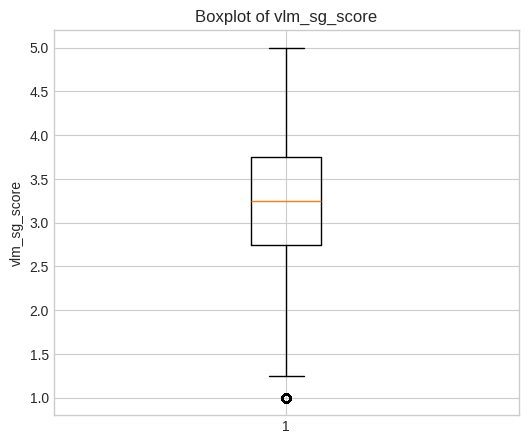

In [5]:
# --- Boxplot ---
plt.figure(figsize=(6, 5))
plt.boxplot(df["vlm_sg_score"].dropna())
plt.title("Boxplot of vlm_sg_score")
plt.ylabel("vlm_sg_score")
plt.show()

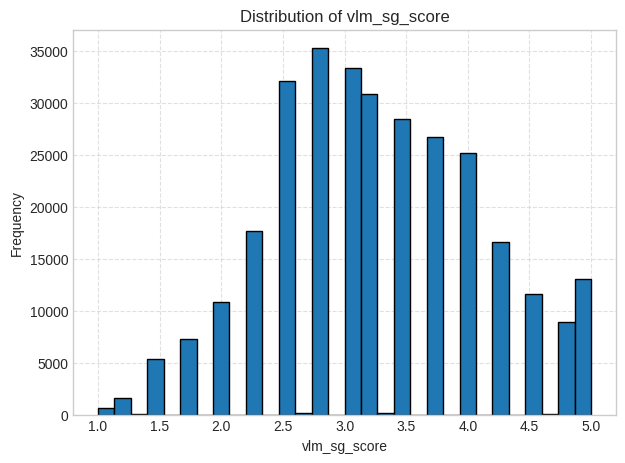

In [6]:
# --- Histogram ---
plt.figure(figsize=(7, 5))
plt.hist(df["vlm_sg_score"].dropna(), bins=30, edgecolor="black")
plt.title("Distribution of vlm_sg_score")
plt.xlabel("vlm_sg_score")
plt.ylabel("Frequency")
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

In [7]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def show_sample_images_by_score(df, image_dir, n_samples=3, seed=None):

    # Validate required columns
    assert "vlm_sg_score" in df.columns, "Missing column: vlm_sg_score"
    assert "image_id" in df.columns, "Missing column: image_id"

    # Iterate through each unique score
    for score in sorted(df["vlm_sg_score"].dropna().unique()):
        subset = df[df["vlm_sg_score"] == score]

        # Random sampling
        sample = subset.sample(min(n_samples, len(subset)), random_state=seed)

        fig, axes = plt.subplots(1, len(sample), figsize=(12, 4))
        fig.suptitle(f"Sample Images for vlm_sg_score = {score}", fontsize=14)

        # Ensure iterable if only one image
        if len(sample) == 1:
            axes = [axes]

        for ax, (_, row) in zip(axes, sample.iterrows()):
            img_path = None
            # Try multiple file extensions
            for ext in [".jpg", ".jpeg", ".png"]:
                potential_path = os.path.join(image_dir, f"{row['image_id']}{ext}")
                if os.path.exists(potential_path):
                    img_path = potential_path
                    break

            if img_path:
                img = Image.open(img_path)
                ax.imshow(img)
                ax.axis("off")
            else:
                ax.text(0.5, 0.5, "Image not found", ha="center", va="center", fontsize=10)
                ax.axis("off")

        plt.tight_layout()
        plt.show()


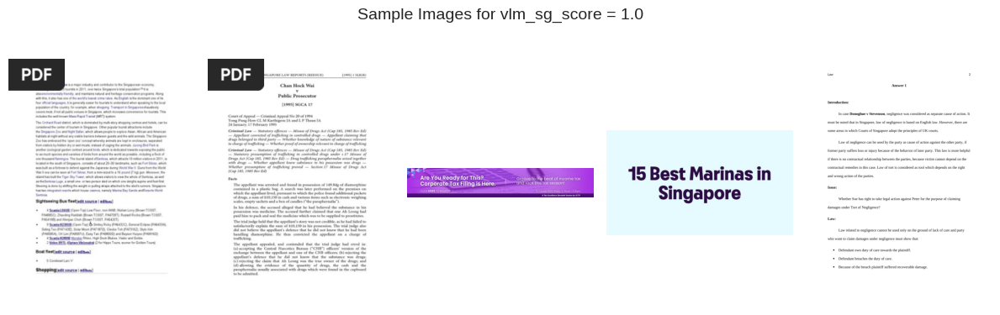

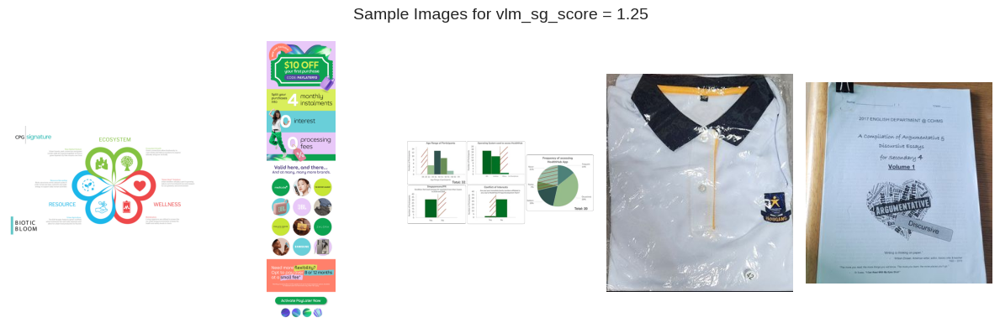

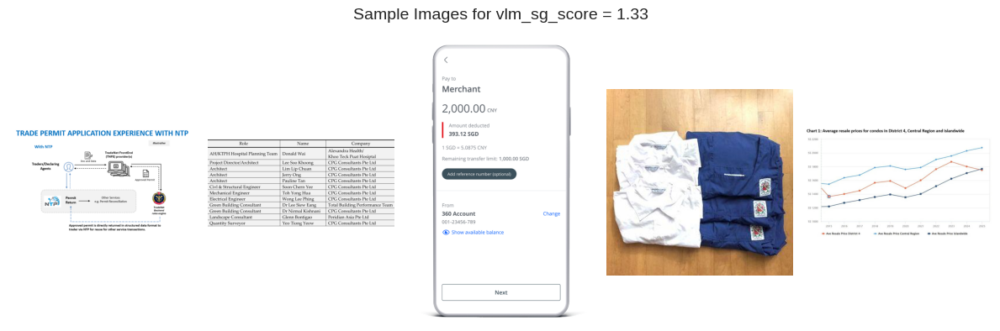

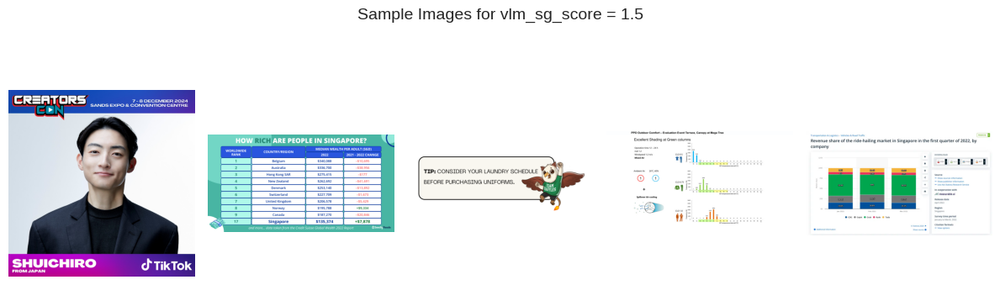

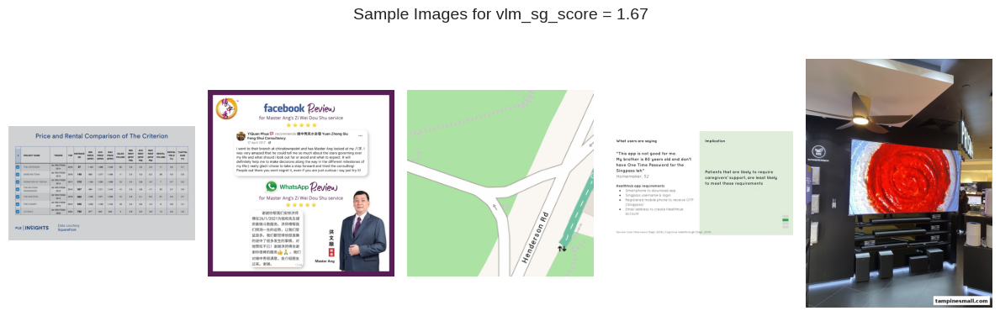

...

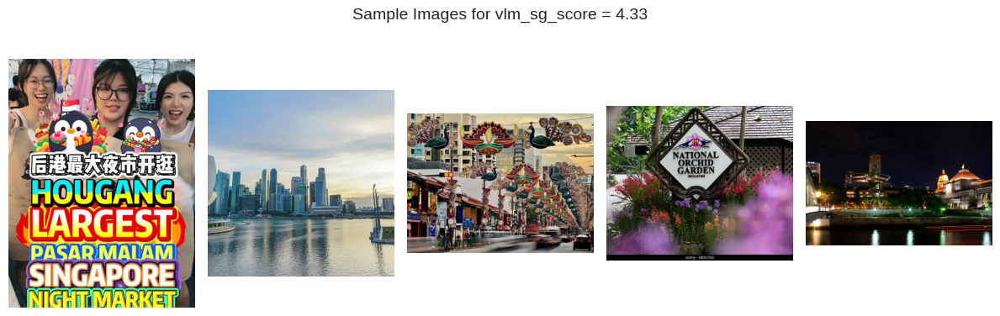

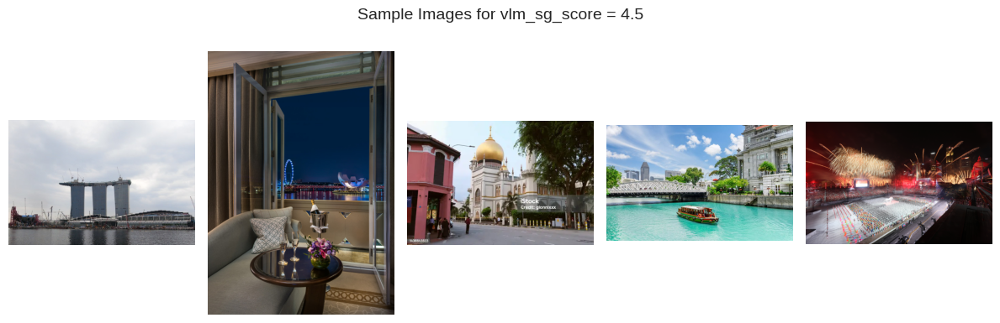

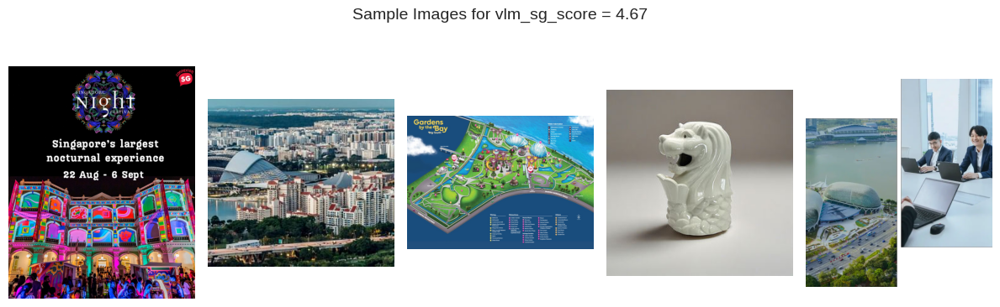

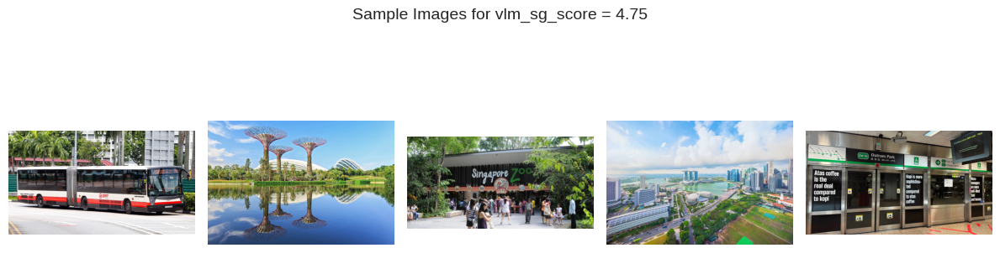

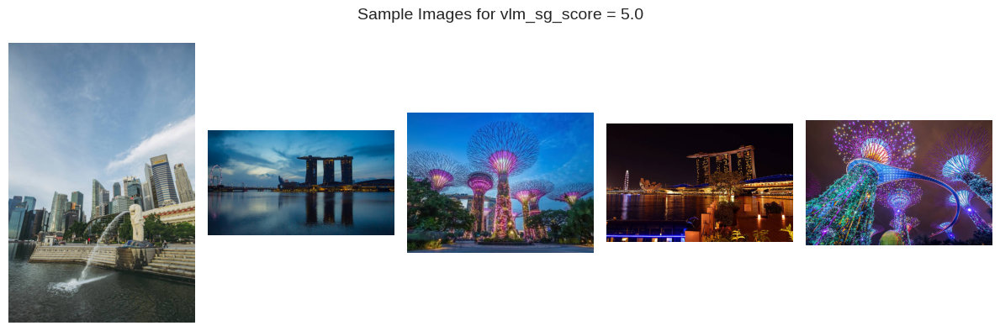

In [8]:
show_sample_images_by_score(df, image_dir, n_samples=5)

# Alignment of the models in filtering

In [9]:
import re
import pandas as pd

# -----------------------------
# Step 1: Load your log file
# -----------------------------
with open("./storage (processed)/180925/3/vlm_results.log", "r", encoding="utf-8") as f:
    raw_text = f.read()

In [10]:

# -----------------------------
# Step 2: Regex patterns
# -----------------------------
# Image ID and Final Score
image_pattern = re.compile(r"Image ID:\s*(\w+)")
final_score_pattern = re.compile(r"Final Score:\s*([\d.]+)")

# Model response pattern (matches model name, score, explanation until next model or section)
model_response_pattern = re.compile(
    r"^\s*([A-Za-z0-9_\-/\.]+):\s*([\d.]+)\s*[–-]\s*(.*?)(?=\n\s*[A-Za-z0-9_\-/\.]+:|\Z)",
    re.DOTALL | re.MULTILINE
)

# -----------------------------
# Step 3: Parse into records
# -----------------------------
records = []

chunks = raw_text.split("------------------------------------------------------------")
for chunk in chunks:
    image_match = image_pattern.search(chunk)
    score_match = final_score_pattern.search(chunk)

    if image_match and score_match:
        image_id = image_match.group(1).strip()
        final_score = float(score_match.group(1).strip())

        for model, decision, explanation in model_response_pattern.findall(chunk):
            records.append({
                "image_id": image_id,
                "final_score": final_score,
                "model": model.strip(),
                "model_decision": float(decision.strip()),
                "model_explanation": explanation.strip()
            })

# -----------------------------
# Step 4: Create long-format DataFrame
# -----------------------------
df = pd.DataFrame(records)

# Optional normalization for readability
model_map = {
    "Qwen/Qwen2.5-VL-72B-Instruct-AWQ": "Qwen-72B",
    "OpenGVLab/InternVL3_5-30B-A3B-Instruct": "InternVL-30B",
    "mistralai/Mistral-Small-3.2-24B-Instruct-2506": "Mistral-24B",
    "zai-org/GLM-4.1V-9B-Base": "GLM-9B",
}
if "model" in df.columns:
    df["model"] = df["model"].replace(model_map)

# Remove duplicates
df = df.drop_duplicates(subset=["image_id", "model"], keep="last")

In [11]:
df.head()

,image_id,final_score,model,model_decision,model_explanation
0,d3ce4df8d9620524adb6e359d0e03bad,5.00,GLM-9B,5.0,The image is extremely useful for training a v...
1,d3ce4df8d9620524adb6e359d0e03bad,5.00,InternVL-30B,5.0,The image prominently features the Merlion sta...
2,d3ce4df8d9620524adb6e359d0e03bad,5.00,Mistral-24B,5.0,"This image clearly shows the Merlion, an iconi..."
3,d3ce4df8d9620524adb6e359d0e03bad,5.00,Qwen-72B,5.0,The image prominently features the Merlion sta...
4,5b7f4d9f312164c5b6967fcbfc3ac359,4.75,GLM-9B,5.0,This image is extremely useful for training a ...


In [12]:
# -----------------------------
# Step 5: Pivot to wide format
# -----------------------------
df_wide_explain = df.pivot_table(
    index=["image_id", "final_score"],
    columns="model",
    values=["model_decision","model_explanation"],
    aggfunc="first"
).reset_index()


In [13]:
df_wide_explain.head()

image_id final_score model_decision  \
model                                                       GLM-9B   
0      00000f968f95ba69a47003243b8ad632        4.00            4.0   
1      00003561af48fc4d6be64fc48618f73f        2.75            3.0   
2      000054ca2b79c0a4c28c9665963ff29d        3.50            3.0   
3      00005d867d03e39aff0d1f765107297a        2.00            1.0   
4      0000af10c0f6e1b23c94ba0e29e7a291        3.25            3.0   

                                         \
model InternVL-30B Mistral-24B Qwen-72B   
0              4.0         4.0      4.0   
1              3.0         2.0      3.0   
2              3.0         4.0      4.0   
3              2.0         2.0      3.0   
4              3.0         3.0      4.0   

                                       model_explanation  \
model                                             GLM-9B   
0      The image shows a cluster of high-rise residen...   
1      The image shows a plate of satay with cucumber...   
2      The image is moderately useful for training a ...   
3      The image is a historical map showing the geog...   
4      The image shows a playground with children pla...   

                                                          \
model                                       InternVL-30B   
0      The image is very useful for training a vision...   
1      The image shows satay skewers with a dipping s...   
2      The image contains some Singapore-related elem...   
3      The image is a historical map of Singapore, la...   
4      The image shows a playground with modern build...   

                                                          \
model                                        Mistral-24B   
0      The image shows high-rise public housing flats...   
1      - The image shows satay skewers, cucumber slic...   
2      - The image prominently features the text "Edu...   
3      The image is a historical map with the word "S...   
4      The image shows a playground area with childre...   

                                                          
model                                           Qwen-72B  
0      The image depicts high-rise residential buildi...  
1      The image shows satay, a popular dish in Singa...  
2      The image prominently features "Educators of S...  
3      The map includes "Sincapura," which refers to ...  
4      The image shows a playground with modern high-...

In [14]:
# -----------------------------
# Step 5: Pivot to wide format
# -----------------------------
df_wide = df.pivot_table(
    index=["image_id", "final_score"],
    columns="model",
    values="model_decision",
    aggfunc="first"
).reset_index()


In [15]:
df_wide

model,image_id,final_score,GLM-9B,InternVL-30B,Mistral-24B,Qwen-72B
0,00000f968f95ba69a47003243b8ad632,4.00,4.0,4.0,4.0,4.0
1,00003561af48fc4d6be64fc48618f73f,2.75,3.0,3.0,2.0,3.0
2,000054ca2b79c0a4c28c9665963ff29d,3.50,3.0,3.0,4.0,4.0
3,00005d867d03e39aff0d1f765107297a,2.00,1.0,2.0,2.0,3.0
4,0000af10c0f6e1b23c94ba0e29e7a291,3.25,3.0,3.0,3.0,4.0
...,...,...,...,...,...,...
305643,ffff4a52bb5cccde4049302506b9dcda,3.00,3.0,3.0,3.0,3.0
305644,ffff7f16da2a8eb66b10acb33c2e7576,3.25,3.0,3.0,3.0,4.0
305645,ffff926bb24c24cfe24715d1c48db1fb,2.25,2.0,1.0,3.0,3.0
305646,ffff9b0b42c1efbf2e9c9aee07e19a85,5.00,5.0,5.0,5.0,5.0


In [16]:
import pandas as pd

# Suppose df_wide is your dataframe
# Normalize scores per model column (excluding 'model', 'image_id', 'final_score')
model_cols = ['GLM-9B', 'InternVL-30B', 'Mistral-24B', 'Qwen-72B']

# Normalization: (x - mean) / std — or use min-max if you prefer
df_norm = df_wide.copy()
df_norm[model_cols] = df_wide[model_cols].apply(lambda x: (x - x.mean()) / x.std())

# Compute correlation matrix between models
corr_matrix = df_norm[model_cols].corr()

print(corr_matrix)


model           GLM-9B  InternVL-30B  Mistral-24B  Qwen-72B
model                                                      
GLM-9B        1.000000      0.657562     0.593618  0.670819
InternVL-30B  0.657562      1.000000     0.587238  0.634386
Mistral-24B   0.593618      0.587238     1.000000  0.646785
Qwen-72B      0.670819      0.634386     0.646785  1.000000


In [17]:
corr_matrix_spearman = df_norm[model_cols].corr(method='spearman')

In [18]:
corr_matrix_spearman

model,GLM-9B,InternVL-30B,Mistral-24B,Qwen-72B
model,,,,
GLM-9B,1.000000,0.653812,0.600126,0.664083
InternVL-30B,0.653812,1.000000,0.582578,0.633786
Mistral-24B,0.600126,0.582578,1.000000,0.653556
Qwen-72B,0.664083,0.633786,0.653556,1.000000


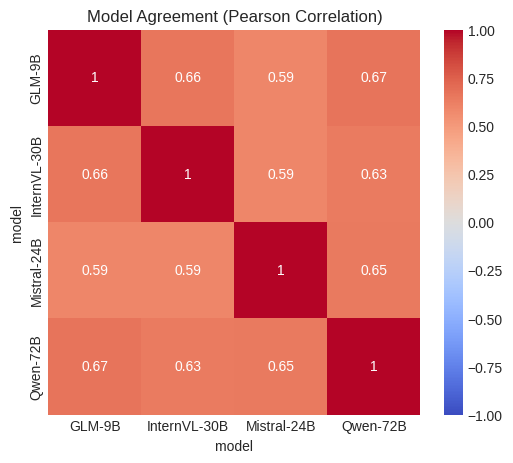

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 5))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Model Agreement (Pearson Correlation)')
plt.show()
